###Mounting Google Drive

In [ ]:
# mount google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


###Importing Libraries

In [ ]:
#import sys
import pickle
import shutil
from os import path, makedirs
import datetime
import itertools
from aenum import MultiValueEnum
import enum
from pathlib import Path

In [ ]:
from PIL import Image as Img

In [ ]:
import numpy as np
np.random.seed(42)

In [ ]:
!pip install geopandas

In [ ]:
import geopandas as gpd
import pandas as pd

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
#import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon
from tqdm.auto import tqdm
from tqdm import tqdm_notebook as tqdm

In [ ]:
import lightgbm as lgb
import joblib
from sklearn import metrics
from sklearn import preprocessing

In [ ]:
!pip install eo-learn --upgrade

In [ ]:
from eolearn.core import (
    EOTask,
    EOPatch,
    EOWorkflow,
    AddFeatureTask,
    linearly_connect_tasks,
    FeatureType,
    OverwritePermission,
    LoadTask,
    SaveTask,
    EOExecutor,
    MergeFeatureTask,
)

In [ ]:
!pip install opencv-python-headless==4.1.2.30

In [ ]:
from eolearn.io import SentinelHubInputTask, VectorImportTask, ExportToTiffTask
from eolearn.geometry import VectorToRasterTask, ErosionTask
from eolearn.features import LinearInterpolationTask, SimpleFilterTask, NormalizedDifferenceIndexTask
from eolearn.ml_tools import FractionSamplingTask
from eolearn.mask import CloudMaskTask
from sentinelhub import BBoxSplitter, UtmZoneSplitter, DataCollection, CRS, CustomUrlParam

In [ ]:
#update torch and torch vision
!pip install -q torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
!pip install fastai==1.0.61

In [ ]:
import fastai

In [ ]:
import torch

In [ ]:
# import computer vision from Fast.AI
from fastai.vision import *
import fastai.callbacks.hooks
import fastai.utils.mem

###Paths

In [ ]:
# Folder where data for running the notebook is stored
DATA_FOLDER = Path('/content/gdrive/My Drive/Colab Notebooks/Slovenia')

In [ ]:
# Locations for collected data and intermediate results
EOPATCH_FOLDER = DATA_FOLDER/'eopatches_81'
RESULTS_FOLDER = DATA_FOLDER/'results_81'
for folder in (EOPATCH_FOLDER, RESULTS_FOLDER):
    os.makedirs(folder, exist_ok=True)

In [ ]:
aoi_tile_grid = DATA_FOLDER/'aoi_tile_grid/'
if not path.isdir(aoi_tile_grid):
    makedirs(aoi_tile_grid)

###AoI

In [ ]:
# Load geojson file
country = gpd.read_file(DATA_FOLDER/'slovenia_border.geojson')

In [ ]:
country.describe()

,NAME,geometry
count,1,1
unique,1,1
top,Slovenia,MULTIPOLYGON (((389782.80073216907 5038223.854...
freq,1,1


In [ ]:
country.head()

,NAME,geometry
0,Slovenia,"MULTIPOLYGON (((389782.801 5038223.855, 389956..."


In [ ]:
# Add 500m buffer to secure sufficient data near border
country = country.buffer(500)

In [ ]:
country.head()

0    POLYGON ((379454.962 5119732.311, 379904.362 5...
dtype: geometry

In [ ]:
# Get the country's shape in polygon format
country_shape = country.geometry.values[0]

In [ ]:
print(country_shape.bounds)

(373582.9928291059, 5029747.864045412, 616767.0183643327, 5191332.300277146)


In [ ]:
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(country_shape.bounds[2]-country_shape.bounds[0],country_shape.bounds[3]-country_shape.bounds[1]))

Dimension of the area is 243184 x 161584 m2


In [ ]:
width_pix = int((country_shape.bounds[2]-country_shape.bounds[0])/10)
height_pix = int((country_shape.bounds[3]-country_shape.bounds[1])/10)
print('Dimension of the area is {} x {} pixels'.format(width_pix, height_pix))

Dimension of the area is 24318 x 16158 pixels


Dimension of the area is 243184 x 161584 m2


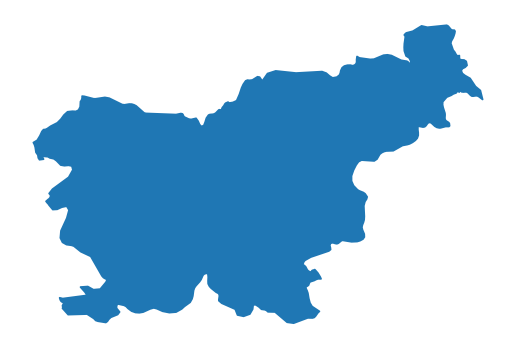

In [ ]:
# Plot country
country.plot()
plt.axis("off")

# Print size
country_width = country_shape.bounds[2] - country_shape.bounds[0]
country_height = country_shape.bounds[3] - country_shape.bounds[1]
print(f"Dimension of the area is {country_width:.0f} x {country_height:.0f} m2")

In [ ]:
country.crs

<Projected CRS: EPSG:32633>
Name: WGS 84 / UTM zone 33N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 12°E and 18°E, northern hemisphere between equator and 84°N, onshore and offshore. Austria. Bosnia and Herzegovina. Cameroon. Central African Republic. Chad. Congo. Croatia. Czechia. Democratic Republic of the Congo (Zaire). Gabon. Germany. Hungary. Italy. Libya. Malta. Niger. Nigeria. Norway. Poland. San Marino. Slovakia. Slovenia. Svalbard. Sweden. Vatican City State.
- bounds: (12.0, 0.0, 18.0, 84.0)
Coordinate Operation:
- name: UTM zone 33N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
country_crs = CRS.UTM_33N

In [ ]:
if country.crs != country_crs:
    print("Correct CRS")
    country = country.to_crs(crs=country_crs.pyproj_crs())

Correct CRS


The splitting choice depends on the available resources of your computer. An EOPatch with a size of has around 500 x 500 pixels at 10 meter resolution has a size of about ~1 GB.

In [ ]:
# Create a splitter to obtain a list of bboxes with 5km sides
bbox_splitter = UtmZoneSplitter([country_shape], country.crs, 5000)

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


In [ ]:
print('Area bounding box: {}\n'.format(bbox_splitter.get_area_bbox().__repr__()))

Area bounding box: BBox(((373582.9928291059, 5029747.864045412), (616767.0183643327, 5191332.300277146)), crs=CRS('32633'))



In [ ]:
print('Each bounding box also has some info how it was created. Example:\n'
      '\nbbox: {}\ninfo: {}\n'.format(bbox_list[0].__repr__(), info_list[0]))

Each bounding box also has some info how it was created. Example:

bbox: BBox(((370000.0, 5120000.0), (375000.0, 5125000.0)), crs=CRS('32633'))
info: {'crs': 'UTM_33N', 'utm_zone': '33', 'utm_row': '', 'direction': 'N', 'index': 0, 'index_x': 0, 'index_y': 19}



In [ ]:
print(bbox_list)

[BBox(((370000.0, 5120000.0), (375000.0, 5125000.0)), crs=CRS('32633'))
 BBox(((370000.0, 5125000.0), (375000.0, 5130000.0)), crs=CRS('32633'))
 BBox(((375000.0, 5115000.0), (380000.0, 5120000.0)), crs=CRS('32633'))
 BBox(((375000.0, 5120000.0), (380000.0, 5125000.0)), crs=CRS('32633')) ...
 BBox(((610000.0, 5155000.0), (615000.0, 5160000.0)), crs=CRS('32633'))
 BBox(((610000.0, 5160000.0), (615000.0, 5165000.0)), crs=CRS('32633'))
 BBox(((615000.0, 5150000.0), (620000.0, 5155000.0)), crs=CRS('32633'))
 BBox(((615000.0, 5155000.0), (620000.0, 5160000.0)), crs=CRS('32633'))]


In [ ]:
len(bbox_splitter.bbox_list)

940

In [ ]:
len(bbox_list)

940

In [ ]:
len(info_list)

940

In [ ]:
if not os.path.isdir(DATA_FOLDER/'tile-def'):
    os.makedirs(DATA_FOLDER/'tile-def')

with open(DATA_FOLDER/'tile-def/slovenia_buffered_bbox_32633.pickle','wb') as fp:
    pickle.dump(bbox_splitter, fp)

In [ ]:
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]

In [ ]:
len(geometry)

940

In [ ]:
type(geometry[0])

shapely.geometry.polygon.Polygon

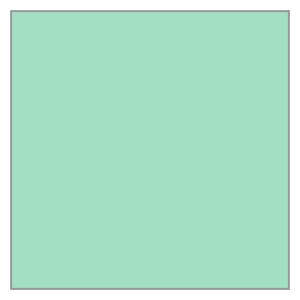

In [ ]:
geometry[0]

In [ ]:
idxs = [info["index"] for info in info_list]

In [ ]:
len(idxs)

940

In [ ]:
idxs_x = [info["index_x"] for info in info_list]

In [ ]:
idxs_y = [info["index_y"] for info in info_list]

In [ ]:
bbox_gdf = gpd.GeoDataFrame({"index": idxs, "index_x": idxs_x, "index_y": idxs_y}, crs=country.crs, geometry=geometry)

In [ ]:
bbox_gdf.describe()

,index,index_x,index_y
count,940.000000,940.000000,940.000000
mean,469.500000,22.610638,15.948936
std,271.498926,11.987013,7.989447
min,0.000000,0.000000,0.000000
25%,234.750000,12.000000,10.000000
50%,469.500000,23.000000,16.000000
75%,704.250000,31.000000,22.000000
max,939.000000,49.000000,33.000000


In [ ]:
bbox_gdf.head()

,index,index_x,index_y,geometry
0,0,0,19,"POLYGON ((370000.000 5120000.000, 370000.000 5..."
1,1,0,20,"POLYGON ((370000.000 5125000.000, 370000.000 5..."
2,2,1,18,"POLYGON ((375000.000 5115000.000, 375000.000 5..."
3,3,1,19,"POLYGON ((375000.000 5120000.000, 375000.000 5..."
4,4,1,20,"POLYGON ((375000.000 5125000.000, 375000.000 5..."


In [ ]:
bbox_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 940 entries, 0 to 939
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   index     940 non-null    int64   
 1   index_x   940 non-null    int64   
 2   index_y   940 non-null    int64   
 3   geometry  940 non-null    geometry
dtypes: geometry(1), int64(3)
memory usage: 29.5 KB


In [ ]:
ID = 448

In [ ]:
patchIDs = []

In [ ]:
# Obtain surrounding 15x15 patches
patchIDs = []
for idx, (bbox, info) in enumerate(zip(bbox_list, info_list)):
    if abs(info["index_x"] - info_list[ID]["index_x"]) <= 4 and abs(info["index_y"] - info_list[ID]["index_y"]) <= 4:
    #if abs(info["index_x"] - info_list[ID]["index_x"]) <= 1 and abs(info["index_y"] - info_list[ID]["index_y"]) <= 1:
        patchIDs.append(idx)

In [ ]:
patchIDs

[356,
 357,
 358,
 359,
 360,
 361,
 362,
 363,
 364,
 376,
 377,
 378,
 379,
 380,
 381,
 382,
 383,
 384,
 397,
 398,
 399,
 400,
 401,
 402,
 403,
 404,
 405,
 420,
 421,
 422,
 423,
 424,
 425,
 426,
 427,
 428,
 444,
 445,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 477,
 496,
 497,
 498,
 499,
 500,
 501,
 502,
 503,
 504,
 522,
 523,
 524,
 525,
 526,
 527,
 528,
 529,
 530,
 549,
 550,
 551,
 552,
 553,
 554,
 555,
 556,
 557]

In [ ]:
len(patchIDs)

81

In [ ]:
# Check if final size is 9x9
if len(patchIDs) != 9 * 9:
#if len(patchIDs) != 3 * 3:
    print("Warning! Use a different central patch ID, this one is on the border.")

In [ ]:
type(patchIDs)

list

In [ ]:
np.array(patchIDs)

array([356, 357, 358, 359, ..., 554, 555, 556, 557])

In [ ]:
np.array(patchIDs).reshape(9, 9)

array([[356, 357, 358, 359, ..., 361, 362, 363, 364],
       [376, 377, 378, 379, ..., 381, 382, 383, 384],
       [397, 398, 399, 400, ..., 402, 403, 404, 405],
       [420, 421, 422, 423, ..., 425, 426, 427, 428],
       ...,
       [469, 470, 471, 472, ..., 474, 475, 476, 477],
       [496, 497, 498, 499, ..., 501, 502, 503, 504],
       [522, 523, 524, 525, ..., 527, 528, 529, 530],
       [549, 550, 551, 552, ..., 554, 555, 556, 557]])

In [ ]:
np.fliplr(np.array(patchIDs).reshape(9, 9))

array([[364, 363, 362, 361, ..., 359, 358, 357, 356],
       [384, 383, 382, 381, ..., 379, 378, 377, 376],
       [405, 404, 403, 402, ..., 400, 399, 398, 397],
       [428, 427, 426, 425, ..., 423, 422, 421, 420],
       ...,
       [477, 476, 475, 474, ..., 472, 471, 470, 469],
       [504, 503, 502, 501, ..., 499, 498, 497, 496],
       [530, 529, 528, 527, ..., 525, 524, 523, 522],
       [557, 556, 555, 554, ..., 552, 551, 550, 549]])

In [ ]:
np.transpose(np.fliplr(np.array(patchIDs).reshape(9, 9)))

array([[364, 384, 405, 428, ..., 477, 504, 530, 557],
       [363, 383, 404, 427, ..., 476, 503, 529, 556],
       [362, 382, 403, 426, ..., 475, 502, 528, 555],
       [361, 381, 402, 425, ..., 474, 501, 527, 554],
       ...,
       [359, 379, 400, 423, ..., 472, 499, 525, 552],
       [358, 378, 399, 422, ..., 471, 498, 524, 551],
       [357, 377, 398, 421, ..., 470, 497, 523, 550],
       [356, 376, 397, 420, ..., 469, 496, 522, 549]])

In [ ]:
np.transpose(np.fliplr(np.array(patchIDs).reshape(9, 9))).ravel()

array([364, 384, 405, 428, ..., 469, 496, 522, 549])

In [ ]:
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(9, 9))).ravel()

In [ ]:
type(patchIDs)

numpy.ndarray

In [ ]:
shapefile_name = "grid_slovenia_9x9.gpkg"
bbox_gdf.to_file(os.path.join(RESULTS_FOLDER, shapefile_name), driver="GPKG")

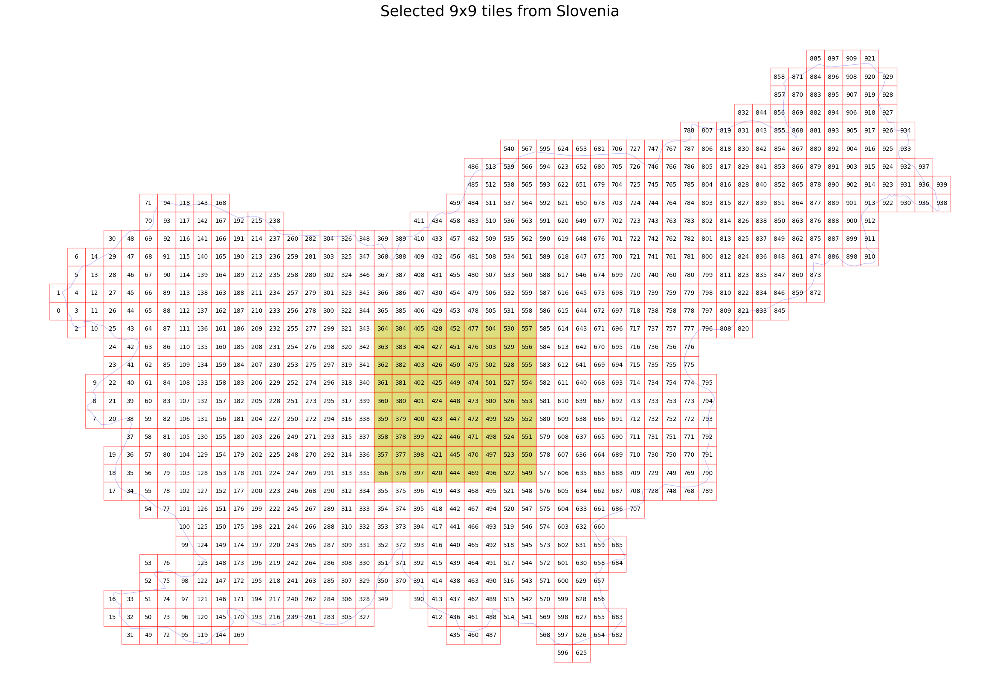

In [ ]:
# Display bboxes over country
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_title("Selected 9x9 tiles from Slovenia", fontsize=25)
country.plot(ax=ax, facecolor="w", edgecolor="b", alpha=0.5)
bbox_gdf.plot(ax=ax, facecolor="w", edgecolor="r", alpha=0.5)

for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info["index"], ha="center", va="center")

# Mark bboxes of selected area
bbox_gdf[bbox_gdf.index.isin(patchIDs)].plot(ax=ax, facecolor="y", edgecolor="r", alpha=0.5)

plt.axis("off");

###Visualizations

In [ ]:
patch = EOPatch.load(EOPATCH_FOLDER/'eopatch_0/')

In [ ]:
patch

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(33, 500, 500, 6), dtype=float32)
    CLP: numpy.ndarray(shape=(33, 500, 500, 1), dtype=uint8)
    NDBI: numpy.ndarray(shape=(33, 500, 500, 1), dtype=float32)
    NDVI: numpy.ndarray(shape=(33, 500, 500, 1), dtype=float32)
    NDWI: numpy.ndarray(shape=(33, 500, 500, 1), dtype=float32)
  }
  mask={
    CLM: numpy.ndarray(shape=(33, 500, 500, 1), dtype=uint8)
    IS_DATA: numpy.ndarray(shape=(33, 500, 500, 1), dtype=bool)
    IS_VALID: numpy.ndarray(shape=(33, 500, 500, 1), dtype=bool)
  }
  mask_timeless={
    LULC: numpy.ndarray(shape=(500, 500, 1), dtype=uint8)
    VALID_COUNT: numpy.ndarray(shape=(500, 500, 1), dtype=int64)
  }
  vector_timeless={
    LULC_REFERENCE: geopandas.GeoDataFrame(columns=['RABA_PID', 'RABA_ID', 'VIR', 'AREA', 'STATUS', 'D_OD', 'lulcid', 'lulcname', 'geometry'], length=1541, crs=EPSG:32633)
  }
  meta_info={
    maxcc: 0.8
    size_x: 500
    size_y: 500
    time_difference: 7200.0
    time_interval: ['2017-0

patch.timestamp

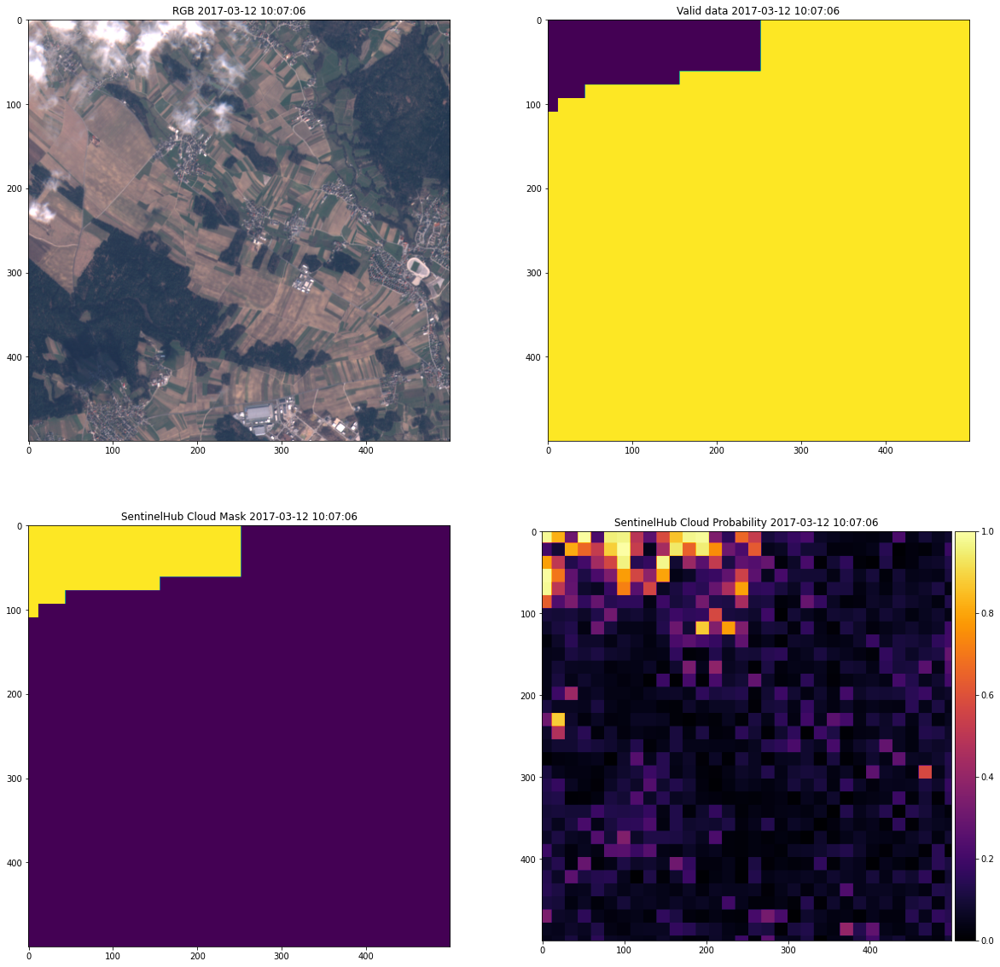

In [ ]:
#Plot RGB, SCL, and Cloud probability, and number of valid observations
def plot_frame(patch, idx, scale=1, save_fig=False):
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20,20))

    axs[0,0].imshow(np.clip(3.5*patch.data['BANDS'][idx][..., [2, 1, 0]],0, 1))
    axs[0,0].set_title(f'RGB {patch.timestamp[idx]}')
    axs[0,1].imshow(patch.mask['IS_VALID'][idx, ..., 0],vmin=0,vmax=1)
    axs[0,1].set_title(f'Valid data {patch.timestamp[idx]}')
    axs[1,0].imshow(patch.mask['CLM'][idx,...,0],vmin=0,vmax=1)
    axs[1,0].set_title(f'SentinelHub Cloud Mask {patch.timestamp[idx]}')
    divider = make_axes_locatable(axs[1,1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    im = axs[1,1].imshow(patch.data['CLP'][idx,...,0]/255.,cmap=plt.cm.inferno, vmin=0.0, vmax=1.0)
    fig.colorbar(im, cax=cax, orientation='vertical')
    axs[1,1].imshow(patch.data['CLP'][idx,...,0]/255.,cmap=plt.cm.inferno)
    axs[1,1].set_title(f'SentinelHub Cloud Probability {patch.timestamp[idx]}')

    if save_fig:
        fig.savefig(f'figs/patch_{idx}_{patch.timestamp[idx]}.png', bbox_inches='tight')
        fig.clf()

plot_frame(patch, 3, scale=3.5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/81 [00:00<?, ?it/s]

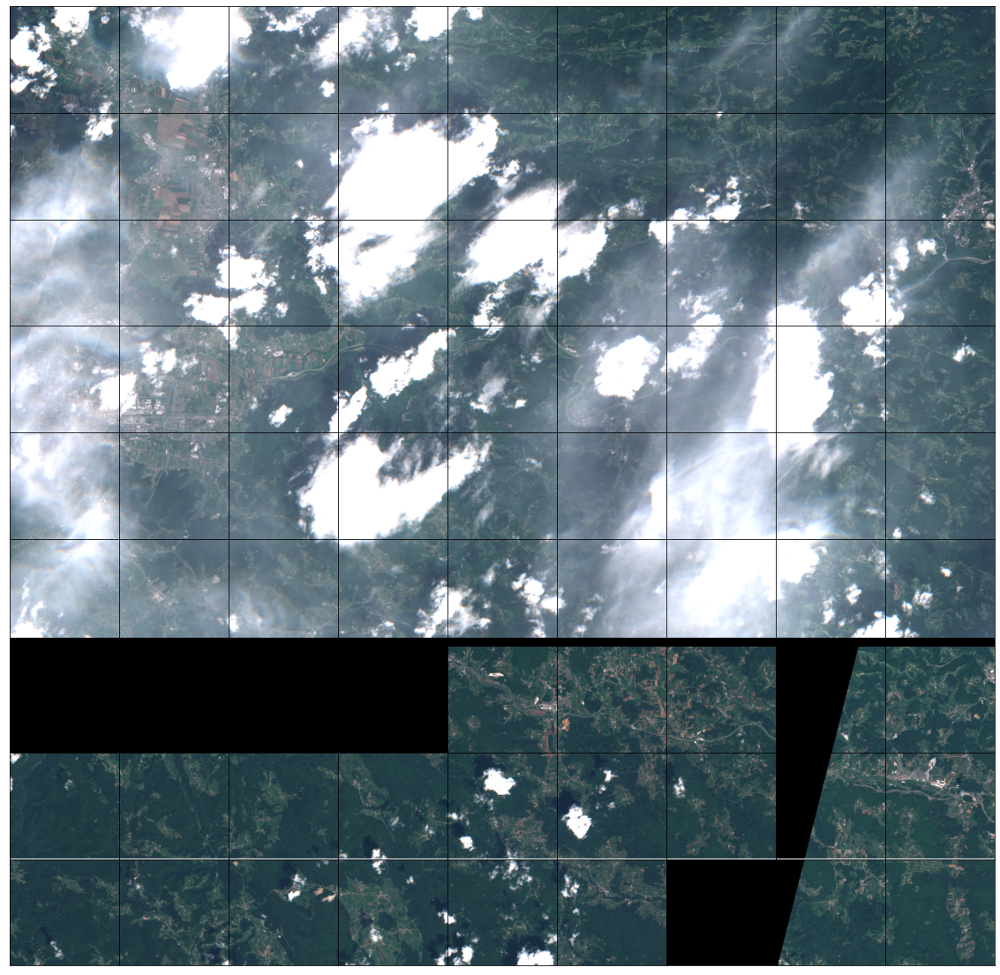

In [ ]:
# Draw the RGB images
fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 20))

date = datetime.datetime(2017, 7, 1)

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    #print(dates)
    #print(np.argsort(abs(date-dates)))
    closest_date_id = np.argsort(abs(date - dates))[0]
    #print(closest_date_id)

    ax = axs[i // 9][i % 9]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

<ipython-input-83-0b833256c693>:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(len(patchIDs))):


  0%|          | 0/81 [00:00<?, ?it/s]

<ipython-input-83-0b833256c693>:10: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])


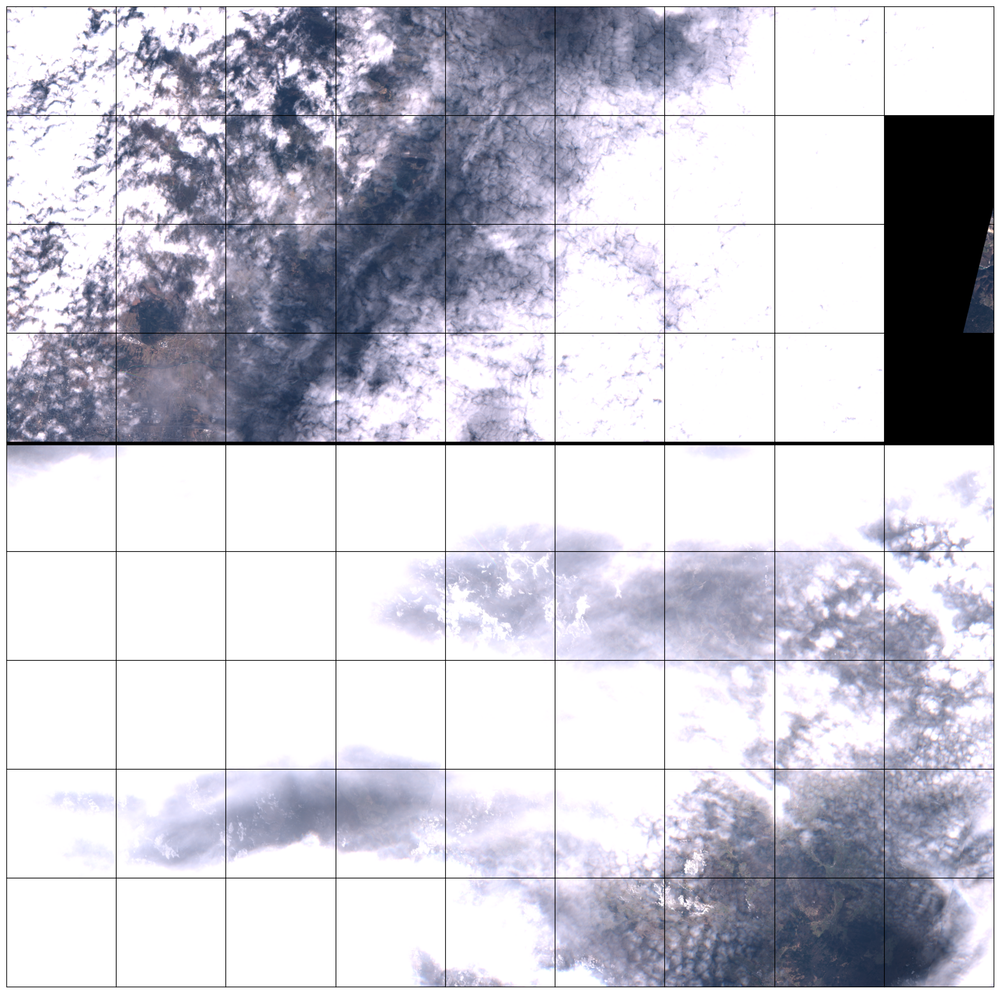

In [ ]:
# Draw the RGB images
fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 20))

date = datetime.datetime(2017, 3, 1)

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    #print(dates)
    #print(np.argsort(abs(date-dates)))
    closest_date_id = np.argsort(abs(date - dates))[0]
    #print(closest_date_id)

    ax = axs[i // 9][i % 9]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/81 [00:00<?, ?it/s]

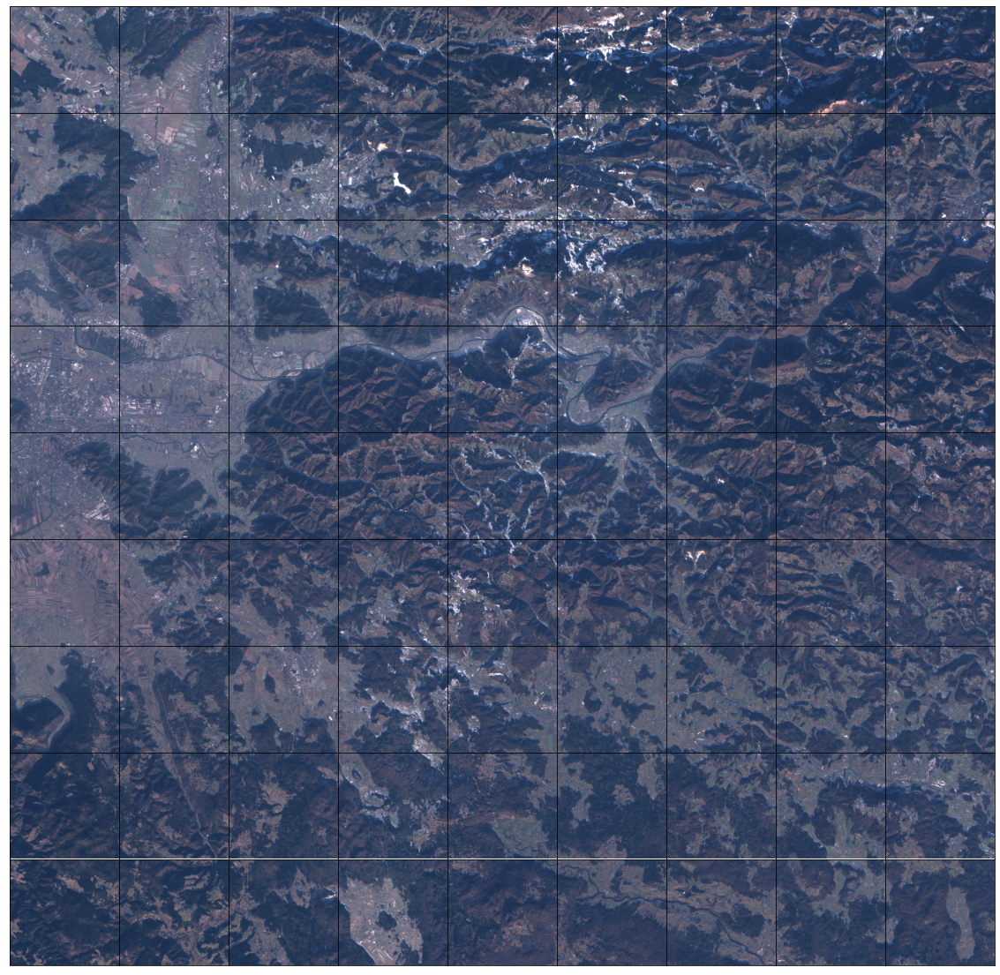

In [ ]:
# Draw the RGB images
fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 20))

date = datetime.datetime(2017, 1, 1)

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    #print(dates)
    #print(np.argsort(abs(date-dates)))
    closest_date_id = np.argsort(abs(date - dates))[0]
    #print(closest_date_id)

    ax = axs[i // 9][i % 9]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/81 [00:00<?, ?it/s]

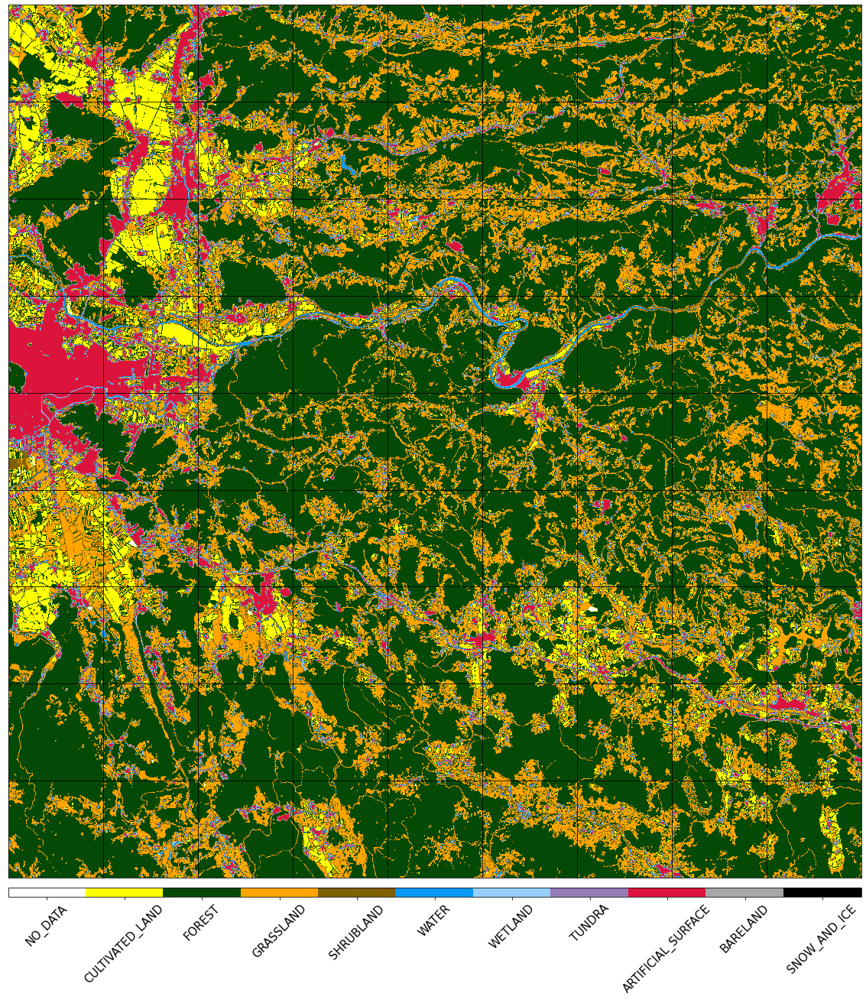

In [ ]:
#Visualize the reference map
fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    ax = axs[i // 9][i % 9]
    im = ax.imshow(eopatch.mask_timeless["LULC"].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.name for entry in LULC], rotation=45, fontsize=15)
plt.show();

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  del sys.path[0]


  0%|          | 0/81 [00:00<?, ?it/s]

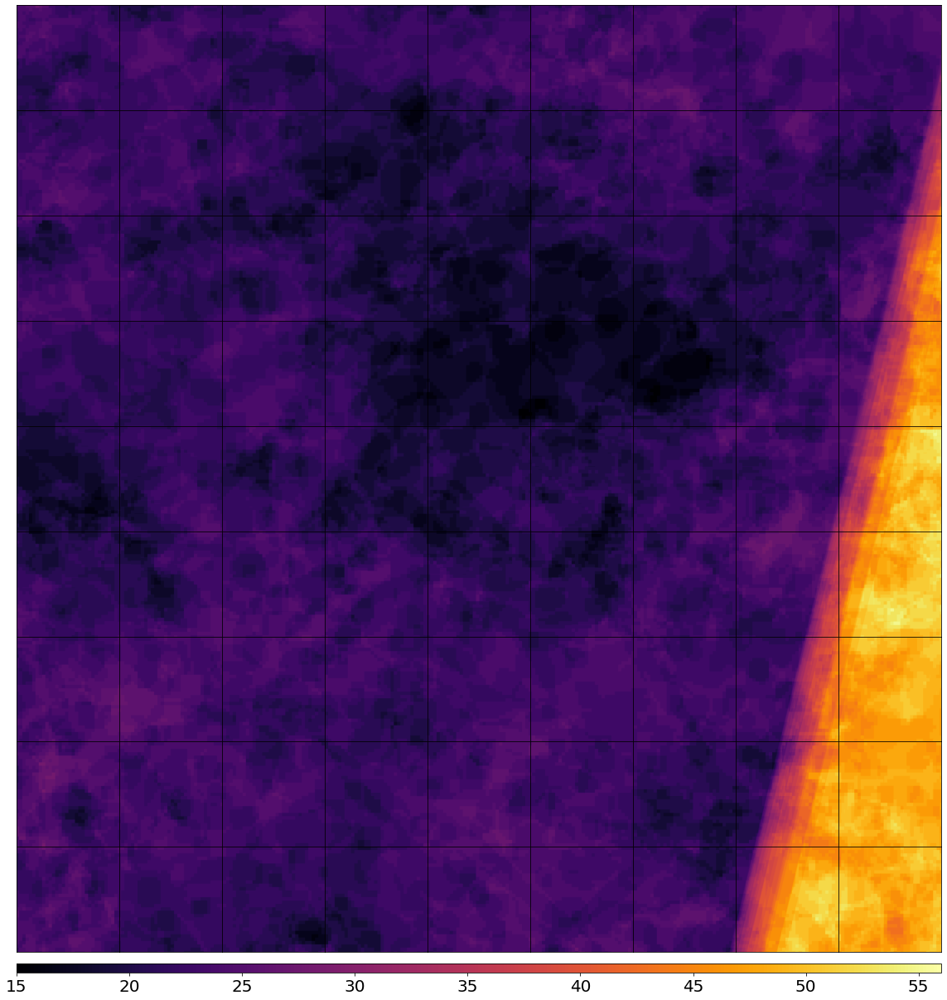

In [ ]:
#Plot the map of valid pixel counts
# Calculate min and max counts of valid data per pixel
vmin, vmax = None, None
for i in range(len(patchIDs)):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    data = eopatch.mask_timeless["VALID_COUNT"].squeeze()
    vmin = np.min(data) if vmin is None else (np.min(data) if np.min(data) < vmin else vmin)
    vmax = np.max(data) if vmax is None else (np.max(data) if np.max(data) > vmax else vmax)

fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ax = axs[i // 9][i % 9]
    im = ax.imshow(eopatch.mask_timeless["VALID_COUNT"].squeeze(), vmin=vmin, vmax=vmax, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice


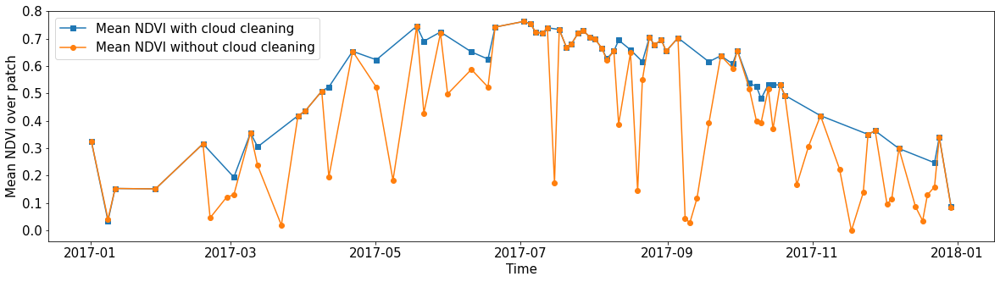

In [ ]:
#Spatial mean of NDVI
#Plot the mean of NDVI over all pixels in a selected patch throughout the year. Filter out clouds in the mean calculation.

eID = 16
eopatch = EOPatch.load(os.path.join(EOPATCH_FOLDER, f"eopatch_{i}"), lazy_loading=True)

ndvi = eopatch.data["NDVI"]
#print(ndvi.shape)
mask = eopatch.mask["IS_VALID"]
#print(mask.shape)
time = np.array(eopatch.timestamp)
#print(time.shape)
#print(time)
t, w, h, _ = ndvi.shape

ndvi_clean = ndvi.copy()
ndvi_clean[~mask] = np.nan  # Set values of invalid pixels to NaN's
#print(ndvi_clean.shape)

# Calculate means, remove NaN's from means
#print(ndvi.shape)
ndvi_mean = np.nanmean(ndvi.reshape(t, w * h), axis=1)
#print(ndvi_mean.shape)
ndvi_mean_clean = np.nanmean(ndvi_clean.reshape(t, w * h), axis=1)
time_clean = time[~np.isnan(ndvi_mean_clean)]
ndvi_mean_clean = ndvi_mean_clean[~np.isnan(ndvi_mean_clean)]

fig = plt.figure(figsize=(20, 5))
plt.plot(time_clean, ndvi_mean_clean, "s-", label="Mean NDVI with cloud cleaning")
plt.plot(time, ndvi_mean, "o-", label="Mean NDVI without cloud cleaning")
plt.xlabel("Time", fontsize=15)
plt.ylabel("Mean NDVI over patch", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={"size": 15});

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/81 [00:00<?, ?it/s]

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02087d3910>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02087d3910>
DEBUG:matplotlib.colorbar:Setting pcolormesh


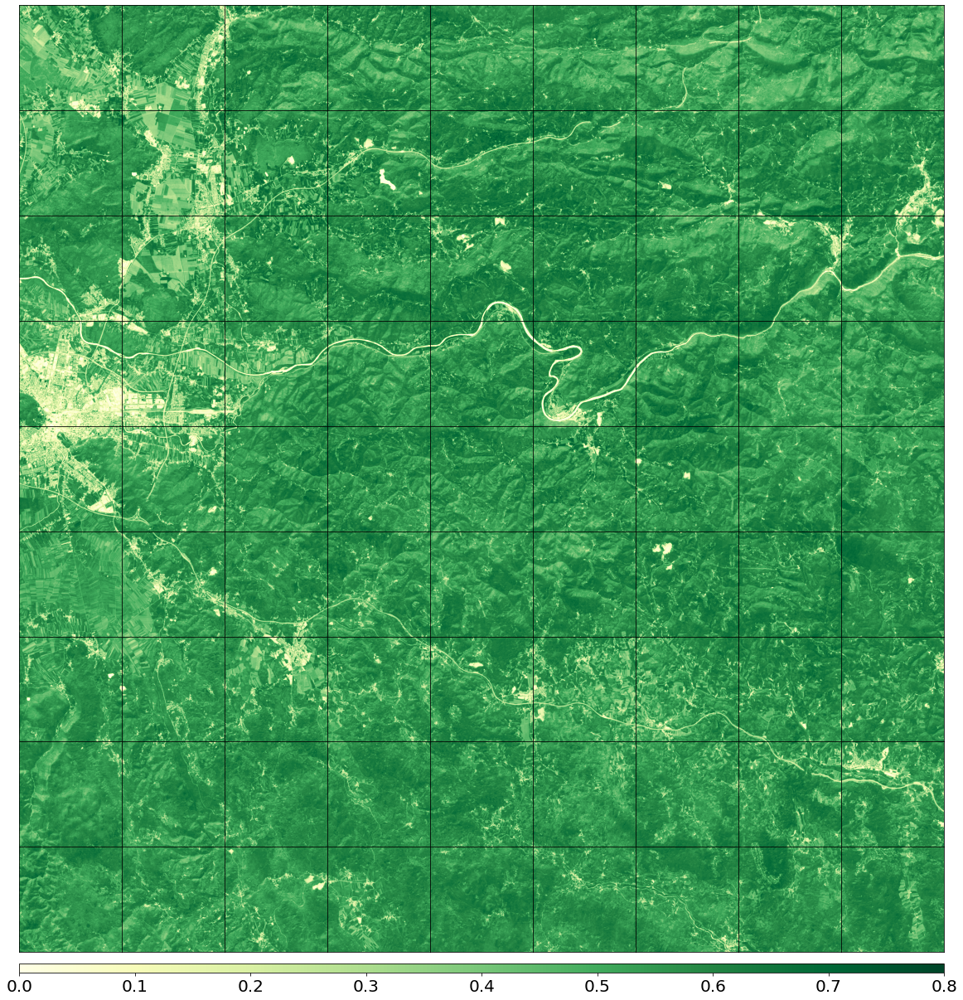

In [ ]:
#Temporal mean of NDVI
#Plot the time-wise mean of NDVI for the whole region. Filter out clouds in the mean calculation.

fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ndvi = eopatch.data["NDVI"]
    mask = eopatch.mask["IS_VALID"]
    ndvi[~mask] = np.nan
    ndvi_mean = np.nanmean(ndvi, axis=0).squeeze()
    #print(ndvi_mean.shape)

    ax = axs[i // 9][i % 9]
    im = ax.imshow(ndvi_mean, vmin=0, vmax=0.8, cmap=plt.get_cmap("YlGn"))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/81 [00:00<?, ?it/s]

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f020824cbd0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f020824cbd0>
DEBUG:matplotlib.colorbar:Setting pcolormesh


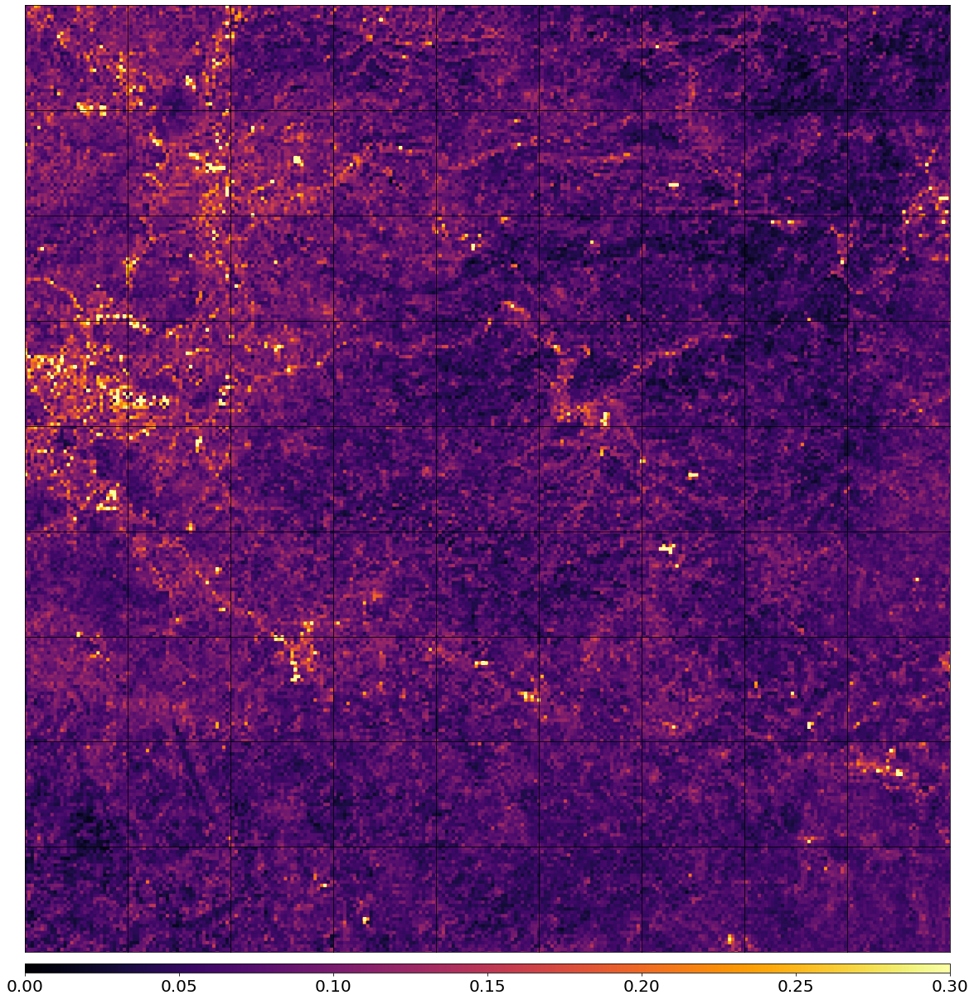

In [ ]:
#Plot the average of the cloud probability for each pixel, take the cloud mask into account.
#Some structures can be seen like road networks etc., indicating a bias of the cloud detector towards these objects.

fig, axs = plt.subplots(nrows=9, ncols=9, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    clp = eopatch.data["CLP"].astype(float) / 255
    mask = eopatch.mask["IS_VALID"]
    clp[~mask] = np.nan
    clp_mean = np.nanmean(clp, axis=0).squeeze()

    ax = axs[i // 9][i % 9]
    im = ax.imshow(clp_mean, vmin=0.0, vmax=0.3, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

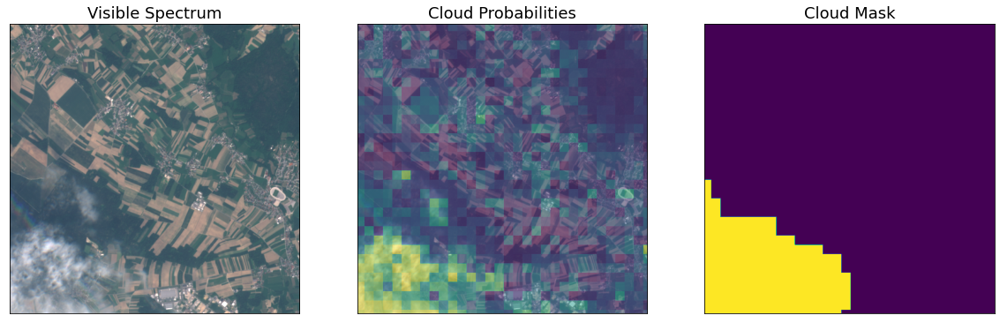

In [ ]:
## Look at the cloud probability and cloud masks

#eopatch = EOPatch.load(eopatch_path/f'eopatch_1', lazy_loading=True)
eopatch = EOPatch.load(EOPATCH_FOLDER/'eopatch_0/', lazy_loading=True)

plt.figure(figsize=(20,8))

ax = plt.subplot(1, 3, 1)
plt.imshow(np.clip(eopatch.data['BANDS'][9][..., [2, 1, 0]] * 3.5, 0, 1))
ax.set_title('Visible Spectrum', size=18)
plt.xticks([])
plt.yticks([])

ax = plt.subplot(1, 3, 2)
plt.imshow(np.clip(eopatch.data['BANDS'][9][..., [2, 1, 0]] * 3.5, 0, 1))
plt.imshow(eopatch.data['CLP'][9].squeeze(),alpha =0.5)
ax.set_title('Cloud Probabilities', size=18)
plt.xticks([])
plt.yticks([])

ax = plt.subplot(1, 3, 3)
plt.imshow(eopatch.mask['CLM'][9].squeeze())
ax.set_title('Cloud Mask', size=18)
plt.xticks([])
plt.yticks([])

del eopatch

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02081bdd10>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02081bdd10>
DEBUG:matplotlib.colorbar:Setting pcolormesh


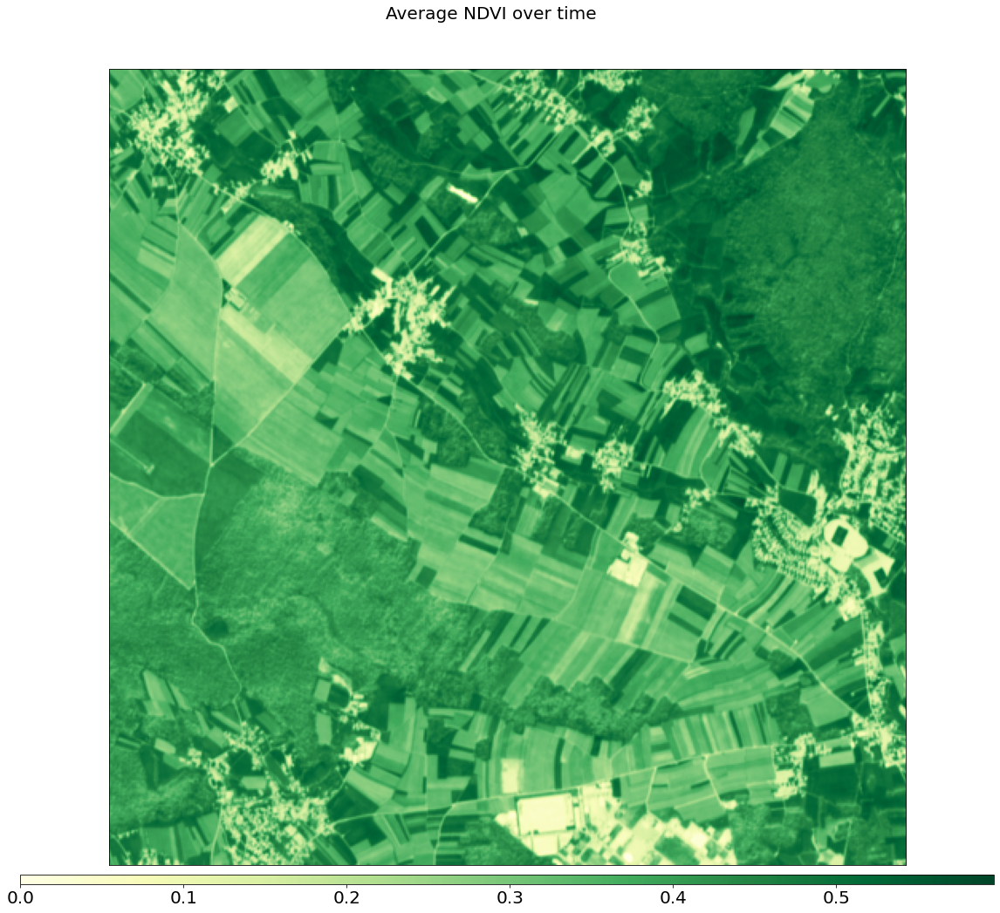

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(EOPATCH_FOLDER/'eopatch_0/', lazy_loading=True)

eopatch.mask_timeless['LULC'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDVI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDVI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f020818a150>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f020818a150>
DEBUG:matplotlib.colorbar:Setting pcolormesh


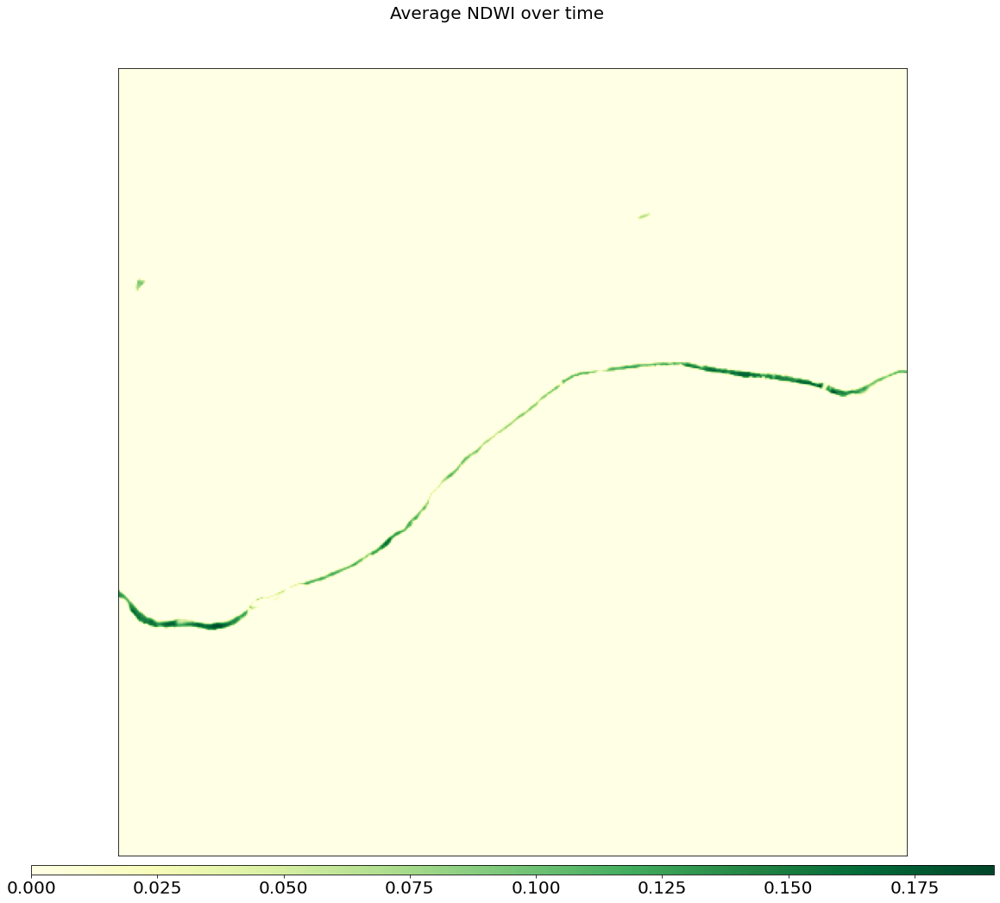

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(EOPATCH_FOLDER/'eopatch_26/', lazy_loading=True)

eopatch.mask_timeless['LULC'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDWI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDWI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02081b53d0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f02081b53d0>
DEBUG:matplotlib.colorbar:Setting pcolormesh


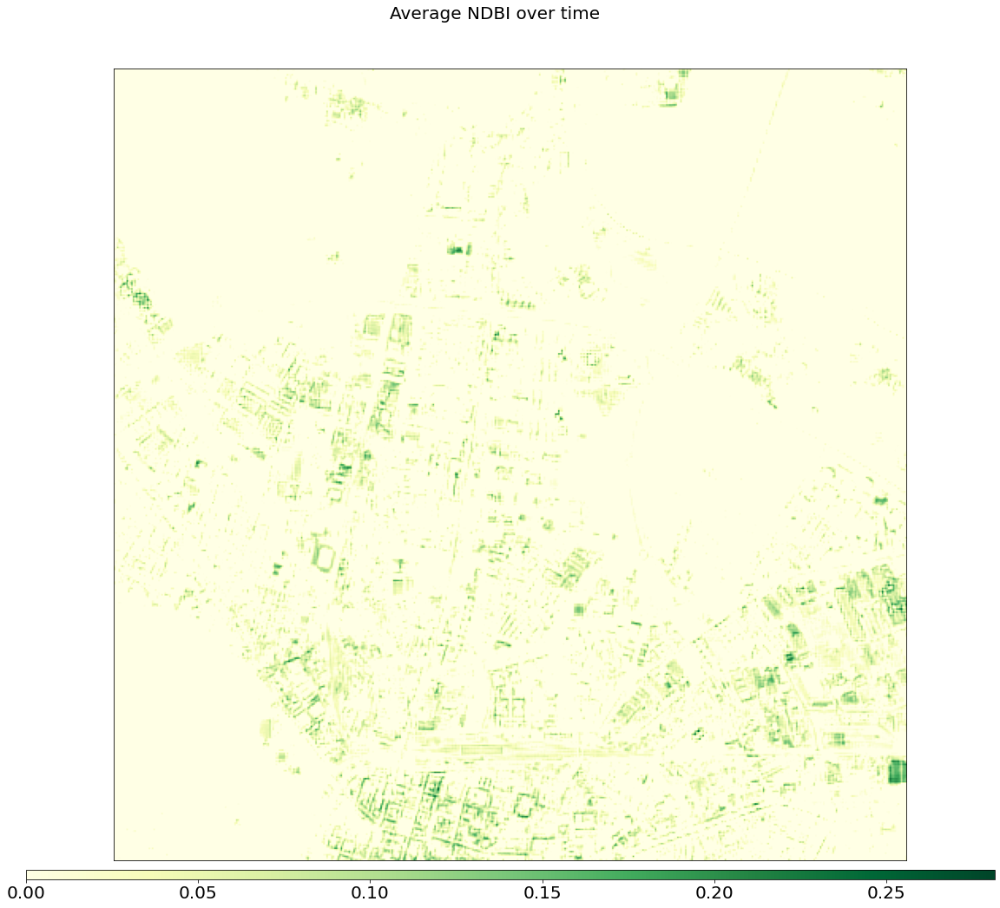

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(EOPATCH_FOLDER/'eopatch_27/', lazy_loading=True)

eopatch.mask_timeless['LULC'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDBI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDBI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7f020815b8d0>
DEBUG:matplotlib.colorbar:Using fixed locator on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7f02081ec410>
DEBUG:matplotlib.colorbar:Using fixed locator on colorbar


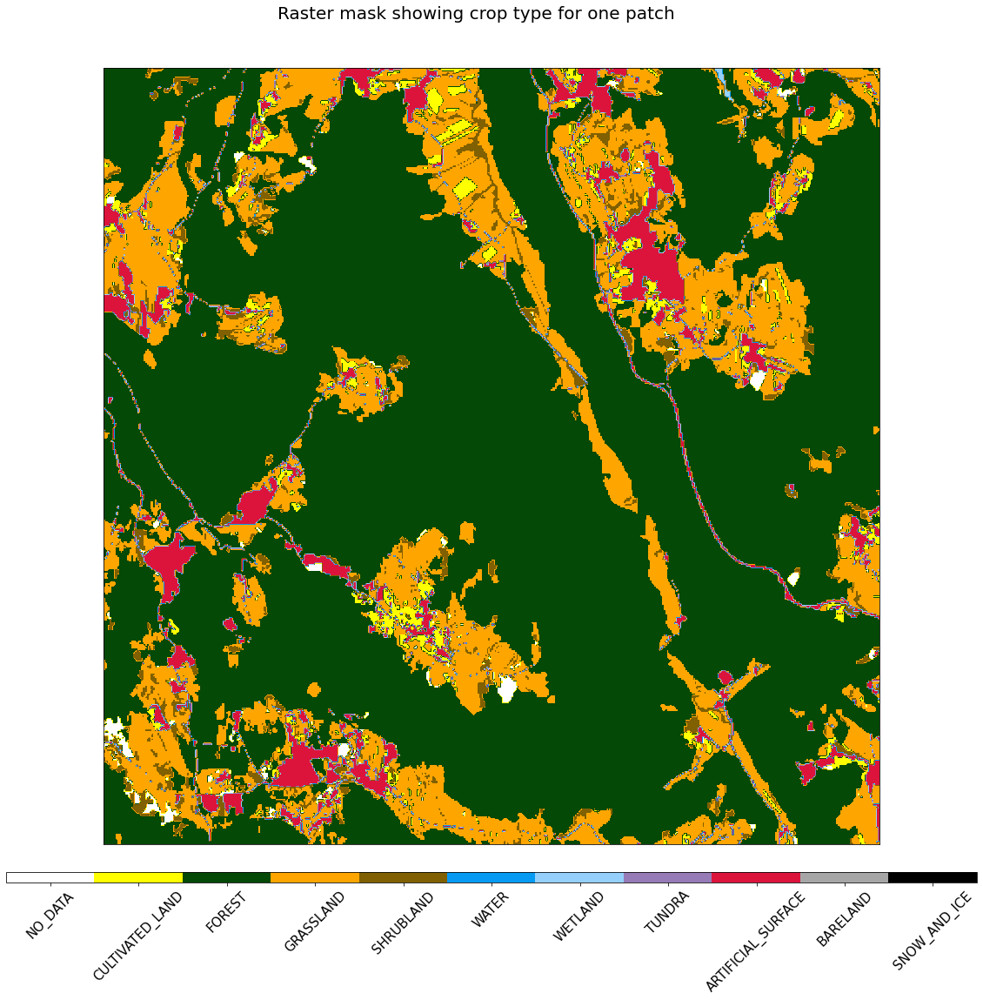

In [ ]:
## View one patch's raster mask

fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(EOPATCH_FOLDER/'eopatch_64/', lazy_loading=True)

eopatch.mask_timeless['LULC'].squeeze()
im = plt.imshow(eopatch.mask_timeless['LULC'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
plt.xticks([])
plt.yticks([])

fig.suptitle('Raster mask showing crop type for one patch', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.03, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.name for entry in LULC], rotation=45, fontsize=15)
plt.show()

del eopatch

###Additional Workflow

In [ ]:
# LOAD EXISTING EOPATCHES
load = LoadTask(EOPATCH_FOLDER)

In [ ]:
# FEATURE CONCATENATION
concatenate = MergeFeatureTask({FeatureType.DATA: ["BANDS", "NDVI", "NDWI", "NDBI"]}, (FeatureType.DATA, "FEATURES"))

In [ ]:
class ValidDataFractionPredicate:
    """Predicate that defines if a frame from EOPatch's time-series is valid or not. Frame is valid if the
    valid data fraction is above the specified threshold.
    """

    def __init__(self, threshold):
        self.threshold = threshold

    def __call__(self, array):
        coverage = np.sum(array.astype(np.uint8)) / np.prod(array.shape)
        return coverage > self.threshold

In [ ]:
# FILTER OUT CLOUDY SCENES
# Keep frames with > 80% valid coverage
valid_data_predicate = ValidDataFractionPredicate(0.8)
filter_task = SimpleFilterTask((FeatureType.MASK, "IS_VALID"), valid_data_predicate)

In [ ]:
time_interval = ['2019-01-01', '2019-12-31']

In [ ]:
# LINEAR TEMPORAL INTERPOLATION
# linear interpolation of full time-series and date resampling
resampling = 16
resampled_range = (time_interval[0], time_interval[1], resampling)
linear_interp = LinearInterpolationTask(
    (FeatureType.DATA, "FEATURES"),  # name of field to interpolate
    mask_feature=(FeatureType.MASK, "IS_VALID"),  # mask to be used in interpolation
    copy_features=[(FeatureType.MASK_TIMELESS, 'LULC'),
    resample_range=resampled_range,
    bounds_error=False
)

In [ ]:
# TASK FOR EROSION
# erode each class of the reference map for training set
erosion = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'LULC','LULC_ERODED'), disk_radius=1)

In [ ]:
from eolearn.features import ValueFilloutTask

In [ ]:
fill_extrapolate = ValueFilloutTask(feature=(FeatureType.DATA,'FEATURES'), operations='fb', value=np.nan, axis=0) #fb: fwd, bwd

In [ ]:
path_out = DATA_FOLDER/'eopatches_train_test/'
if not path.isdir(path_out):
    makedirs(path_out)

In [ ]:
save = SaveTask(path_out, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [ ]:
# Define the workflow
workflow_nodes = linearly_connect_tasks(load,
                                        concatenate,
                                        linear_interp,
                                        erosion,
                                        fill_extrapolate,
                                        save)

In [ ]:
workflow = EOWorkflow(workflow_nodes)

In [ ]:
workflow.dependency_graph()

In [ ]:
%%time

execution_args = []
for idx in range(len(patchIDs)):
    execution_args.append(
        {
            workflow_nodes[0]: {"eopatch_folder": f"eopatch_{idx}"},  # load
            #workflow_nodes[-2]: {"seed": 42},  # sampling
            workflow_nodes[-1]: {"eopatch_folder": f"eopatch_{idx}"},  # save
        }
    )

executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=5)

executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

###Train-test split

In [ ]:
path_out = DATA_FOLDER/'eopatches_train_test/'

In [ ]:
trainIDs = list(range(len(eopatches)))
print(trainIDs)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


In [ ]:
test_ratio = 4
testIDs = trainIDs[0::test_ratio]  # take every xth patch for testing, i.e.,  [3]
print(testIDs)

[0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 68, 72, 76, 80]


In [ ]:
len(testIDs)

21

In [ ]:
for elem in trainIDs:
  if elem in testIDs:
    trainIDs.remove(elem)

In [ ]:
len(trainIDs)

60

In [ ]:
import pickle as pkl

In [ ]:
def save_train_grid(patch_path, patch_idx, out_path, size=64):

    patch_path = Path(patch_path)
    out_path = Path(out_path)
    #out_lbls_path = Path(out_lbls_path)

    out_path.mkdir(exist_ok=True, parents=True)
    #out_lbls_path.mkdir(exist_ok=True, parents=True)

    patch = EOPatch.load(patch_path/f'eopatch_{patch_idx}')

    half_size = size//2

    #test_field_ids = patch.mask_timeless['FIELD_ID_TEST']
    train_field_ids = patch.mask_timeless['LULC_ERODED'] #500*500*1
    #print("test_field_ids", test_field_ids.shape)

    patch_shape = train_field_ids.squeeze().shape
    #print("patch_shape:", patch_shape) #500*500

    shape_x = patch_shape[0]
    #print("shape_x", shape_x) #500
    shape_y = patch_shape[1]
    #print("shape_y", shape_y) #500

    features = patch.data['FEATURES'] # R G B NDVI
    #print("features.shape", features.shape) #23*500*500*9
    #for size=64
    c = (shape_x//size)+1
    #print("c", c) #8
    r = (shape_y//size)+1
    #print("r", r) #8

    for i in range(c):
        for j in range(r):
            x_offset = i*size
            #print("x_offset", x_offset)
            y_offset = j*size
            #print("y_offset", y_offset)

            field_id_fn = f'patch_{patch_idx}_x_{x_offset}_y_{y_offset}_targ.pkl'
            feat_fn     = f'patch_{patch_idx}_x_{x_offset}_y_{y_offset}_feat.pkl'

            patchlet_field_ids = train_field_ids[x_offset:x_offset+size,
                                                y_offset:y_offset+size,...]
            #print("patchlet_field_ids", patchlet_field_ids.shape) #(64, 64, 1)

            if patchlet_field_ids.max() > 0: #save patchlet only if there exists a field in it, i.e., maximum value (id) of any field is > 0.

                feat_arr = features[:,x_offset:x_offset+size,
                                      y_offset:y_offset+size,:]
                #print("feat_arr", feat_arr.shape) #(23, 64, 64, 9)

                if (patchlet_field_ids.shape[0] < size) or (patchlet_field_ids.shape[1] < size):
                    #print("in if")
                    short_x = size - patchlet_field_ids.shape[0]
                    #print("short_x", short_x)
                    short_y = size - patchlet_field_ids.shape[1]
                    #print("short_y", short_y)

                    patchlet_field_ids = np.pad(patchlet_field_ids,
                                                   ((0,short_x),(0,short_y),(0,0)),
                                                   mode='constant',
                                                   constant_values=0)
                    #print("patchlet_field_ids", patchlet_field_ids.shape)

                    feat_arr           = np.pad(feat_arr,
                                                   ((0,0),(0,short_x),(0,short_y),(0,0)),
                                                   mode='reflect')

                  #print("feat_arr", feat_arr.shape)
                if (feat_arr.shape[1] != size or feat_arr.shape[2] != size):
                  print("Exception: Cannot save patch")
                  print("feat_arr", feat_arr.shape)
                  continue

                pkl.dump(patchlet_field_ids, open(out_path/field_id_fn,'wb'))
                pkl.dump(feat_arr, open(out_path/feat_fn,'wb'))
    del patch

In [ ]:
EOPATCH_OUTPUT_FOLDER = DATA_FOLDER/'output_9_9'
EOPATCH_OUTPUT_FOLDER.mkdir(exist_ok=True, parents=True)

In [ ]:
train_patchlet_path = EOPATCH_OUTPUT_FOLDER/'train_patchlets_64_64'
test_patchlet_path = EOPATCH_OUTPUT_FOLDER/'test_patchlets_64_64'

In [ ]:
train_patchlet_path.mkdir(exist_ok=True, parents=True)
test_patchlet_path.mkdir(exist_ok=True, parents=True)

In [ ]:
for i in trainIDs:
    save_train_grid(patch_path=path_out, patch_idx=i, out_path=train_patchlet_path, size=64)

In [ ]:
print(len([name for name in os.listdir(train_patchlet_path) if os.path.isfile(os.path.join(train_patchlet_path, name))]))

In [ ]:
def save_test_grid(patch_path, patch_idx, out_path, size=64):

    patch_path = Path(patch_path)
    out_path = Path(out_path)
    #out_lbls_path = Path(out_lbls_path)

    out_path.mkdir(exist_ok=True, parents=True)
    #out_lbls_path.mkdir(exist_ok=True, parents=True)

    patch = EOPatch.load(patch_path/f'eopatch_{patch_idx}')

    half_size = size//2

    #test_field_ids = patch.mask_timeless['FIELD_ID_TEST']
    test_field_ids = patch.mask_timeless['LULC_ERODED']
    #print("test_field_ids", test_field_ids.shape)

    patch_shape = test_field_ids.squeeze().shape
    #print("patch_shape:", patch_shape)

    shape_x = patch_shape[0]
    #print("shape_x", shape_x)
    shape_y = patch_shape[1]
    #print("shape_y", shape_y)

    features = patch.data['FEATURES'] # R G B NDVI
    #print("features.shape", features.shape)

    c = (shape_x//size)+1
    #print("c", c)
    r = (shape_y//size)+1
    #print("r", r)

    for i in range(c):
        for j in range(r):
            x_offset = i*size
            #print("x_offset", x_offset)
            y_offset = j*size
            #print("y_offset", y_offset)

            field_id_fn = f'patch_{patch_idx}_x_{x_offset}_y_{y_offset}_targ.pkl'
            feat_fn     = f'patch_{patch_idx}_x_{x_offset}_y_{y_offset}_feat.pkl'

            patchlet_field_ids = test_field_ids[x_offset:x_offset+size,
                                                y_offset:y_offset+size,...]
            #print("patchlet_field_ids", patchlet_field_ids.shape)

            if patchlet_field_ids.max() > 0: #save patchlet only if there exists a field in it, i.e., maximum value (id) of any field is > 0.

                feat_arr = features[:,x_offset:x_offset+size,
                                      y_offset:y_offset+size,:]
                #print("feat_arr", feat_arr.shape)

                if (patchlet_field_ids.shape[0] < size) or (patchlet_field_ids.shape[1] < size):
                    #print("in if")
                    short_x = size - patchlet_field_ids.shape[0]
                    #print("short_x", short_x)
                    short_y = size - patchlet_field_ids.shape[1]
                    #print("short_y", short_y)

                    patchlet_field_ids = np.pad(patchlet_field_ids,
                                                   ((0,short_x),(0,short_y),(0,0)),
                                                   mode='constant',
                                                   constant_values=0)
                    #print("patchlet_field_ids", patchlet_field_ids.shape)

                    feat_arr           = np.pad(feat_arr,
                                                   ((0,0),(0,short_x),(0,short_y),(0,0)),
                                                   mode='reflect')

                    #print("feat_arr", feat_arr.shape)
                #if (feat_arr.shape[1] != 64 or feat_arr.shape[2] != 64):
                  #print("Exception: Cannot save patch")
                  #print("feat_arr", feat_arr.shape)
                  #continue

                pkl.dump(patchlet_field_ids, open(out_path/field_id_fn,'wb'))
                pkl.dump(feat_arr, open(out_path/feat_fn,'wb'))
    del patch

In [ ]:
for i in testIDs:
    save_test_grid(patch_path=path_out, patch_idx=i, out_path=test_patchlet_path, size=64)

In [ ]:
print(len([name for name in os.listdir(test_patchlet_path) if os.path.isfile(os.path.join(test_patchlet_path, name))]))